# Introduction

This notebook deals with the project on Real time mask detection. It detects the face using open cv 'haarcascade' face classifier, then applies the ML model to identify the face patterns which leads it to identify, if the person is wearing a mask or not.

# Performing all the imports


In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_hub as hub # for accessing our ML model from tensorflow hub
from IPython.display import Image # to display an image
import os # to access the floders of CWD
from sklearn.model_selection import train_test_split, cross_val_score # to split the training and testing data
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread # to read an image as a numpy array
import datetime
import time
from sklearn.metrics import accuracy_score
import cv2
import glob
import shutil
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import random
import seaborn as sns
import dataframe_image as dfi
import imghdr

# Labelling all the unalabelled images and storing them in CSV format  

In [2]:
for img in os.listdir("D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined"):
    path = os.path.join("D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined", img)
    os.remove(path)
os.remove("D:/Computer Science/ML/ML Mask Face Identifier Project/labels.csv")

In [3]:
With_mask = []
Without_mask = []
Incorrect_mask = []
for img in os.listdir("D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask"):
    path = os.path.join("D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask",img)
    With_mask.append(path)
for img in os.listdir("D:/Computer Science/ML/ML Mask Face Identifier Project/data/without_mask"):
    path = os.path.join("D:/Computer Science/ML/ML Mask Face Identifier Project/data/without_mask",img)
    Without_mask.append(path)


In [4]:
random.shuffle(With_mask)
random.shuffle(Without_mask)


In [118]:
labels = []
a = 0
b = 0
dst_dir = "D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined"
for file in With_mask:
    if True:
        img = file.replace("D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\\", "")
        labels.append((img,"With Mask"))
        shutil.copy(file, dst_dir)
        a = a+1
print(a)
for file in Without_mask:
    if True:
        img = file.replace("D:/Computer Science/ML/ML Mask Face Identifier Project/data/without_mask\\","")
        labels.append((img,"Without Mask"))
        shutil.copy(file, dst_dir)
        b = b + 1
print(b)
print(labels[:5])
labels = pd.DataFrame(labels, columns=['name', 'label'])
labels.to_csv("D:/Computer Science/ML/ML Mask Face Identifier Project/labels.csv", index=False)


5484
5521
[('00118002.jpg', 'With Mask'), ('00386015.jpg', 'With Mask'), ('22.jpg', 'With Mask'), ('00240002.jpg', 'With Mask'), ('00186011.jpg', 'With Mask')]


# Reading in the created CSV file which contains the labels and the image file names

In [119]:
labels_csv = pd.read_csv("labels.csv")
print(labels_csv.describe())


                name         label
count          11005         11005
unique         11005             2
top     00118002.jpg  Without Mask
freq               1          5521


In [120]:
np.sum(labels_csv.label == 'Without Mask')

5521

In [121]:
np.sum(labels_csv.label == 'With Mask')

5484

In [122]:
labels_csv.head()

,name,label
0,00118002.jpg,With Mask
1,00386015.jpg,With Mask
2,22.jpg,With Mask
3,00240002.jpg,With Mask
4,00186011.jpg,With Mask


In [123]:
labels_shuffled=labels_csv.sample(frac=1)
labels_shuffled.head()

,name,label
9339,Unmasked_0 (5387).jpg,Without Mask
10342,Unmasked_0 (3018).jpg,Without Mask
1787,00377001.jpg,With Mask
9284,Unmasked_0 (773).jpg,Without Mask
1147,00106000.jpg,With Mask


In [124]:
labels_shuffled.describe() # for checking if the number of images in shuffled dataset matches the number of images in the original dataset.

,name,label
count,11005,11005
unique,11005,2
top,Unmasked_0 (5387).jpg,Without Mask
freq,1,5521


# Create path names from Image's names

In [125]:
filename = ["D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/" + fname for fname in labels_shuffled["name"]]
filename[:10]

['D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/Unmasked_0 (5387).jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/Unmasked_0 (3018).jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00377001.jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/Unmasked_0 (773).jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00106000.jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/Unmasked_0 (3190).jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00111002.jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00376005.jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00383003.jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00402053.jpg']

# Creating labels in Numpy array and to create the Boolean array from it

In [126]:
labels = labels_shuffled["label"]
labels = np.array(labels)
unique_labels = np.unique(labels)
labels, unique_labels

(array(['Without Mask', 'Without Mask', 'With Mask', ..., 'With Mask',
        'Without Mask', 'Without Mask'], dtype=object),
 array(['With Mask', 'Without Mask'], dtype=object))

In [127]:
# Turn every label into a boolean array
boolean_labels = [label == unique_labels for label in labels]
boolean_labels[:10]

[array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False])]

# Splitting our data into train and test set

In [128]:
x = filename
y = boolean_labels
x_train_val, x_test, y_train_val, y_test = train_test_split(x,y,test_size=0.2,random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train_val,y_train_val, test_size=0.25, random_state=42)
len(x_train), len(y_train),len(x_val), len(y_val), len(x_test), len(y_test), x_train[:5],y_train[:2]

(6603,
 6603,
 2201,
 2201,
 2201,
 2201,
 ['D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/24.jpg',
  'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00391030.jpg',
  'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00045',
  'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00376010.jpg',
  'D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined/00386011.jpg'],
 [array([ True, False]), array([ True, False])])

# Preprocessing our images and there Lbels
We'll now process our images as our labels of our images and filepath to those images are ready

In [129]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
    # Read in an image file
    image = tf.io.read_file(image_path)
    #Turn JPEG into numeric Tensor with 3 colour channels (R, G, B)
    image = tf.image.decode_image(image, channels=3, expand_animations = False)
    # Conert the colour channel values from 0 to 255 to 0-1 values, normalization
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image to our desired value ( 224, 224 )
    image = tf.image.resize(image, size=[img_size, img_size])
    return image

In [130]:
# create a simple function to return a tupple of tensors
def get_image_label(image_path, label):
    """
    takes an image file path and labels associated woth it, processes it and returns the tuple of(image, label)
    """
    image = process_image(image_path)
    return image, label

In [142]:
# Define the batch size, 32, converting our dataset into the batches of 32 images so as to limit the RAM or Memory usage
BATCH_SIZE = 32

# create a function to turn data into labels
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of image x and label y pairs.
    it shuffles the data if it's traing but doesnt shuffle if its validation data.
    Also accepts test data as imputs (no Labels)
    """
    #If the data is a test data set, we don't have labels
    if test_data:
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only file path (no labels)
        data_batch = data.map(process_image).batch(BATCH_SIZE)  
        return data_batch
    elif valid_data:
        print("creating validation data batches..")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y))) #filepaths and labels
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch
    else:
        print("Creating training data batches..")
        #turn file paths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
        # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size=len(x))
        # create (image, label) tuples (this also turns the image path into a preprocessed image)
        data = data.map((get_image_label))
        # Turn the training data into batches
        data_batch = data.batch(BATCH_SIZE)
        return data_batch

In [143]:
train_data = create_data_batches(x_train,y_train) # preprocessing our training labels and images
val_data = create_data_batches(x_val, y_val, valid_data=True) # preprocessing our validation labels and images

Creating training data batches..
creating validation data batches..


# Visualising our created Data Batches

In [144]:
# create a function to view images in a data betch
def show_25_images(images, labels=None):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # setup the figure
  plt.figure(figsize=(10, 10))
  # Loop trhough 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_labels[labels[i].argmax()])
    # turn the grid lines off
    plt.axis("off")

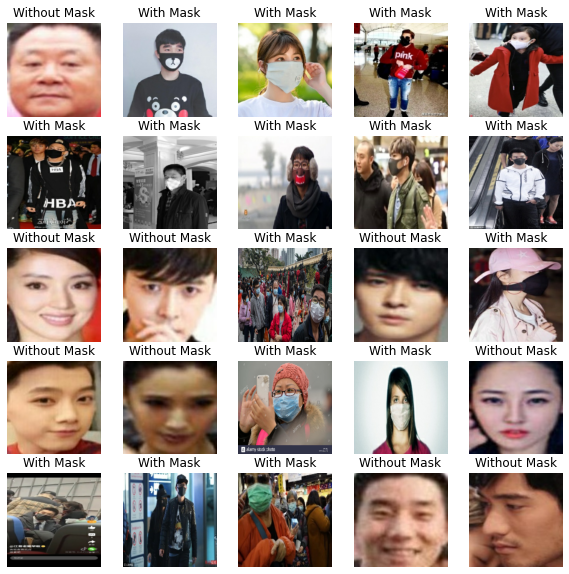

In [145]:
# Now lets visualise the data in the training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [135]:
def check_images( s_dir, ext_list):
    bad_images=[]
    bad_ext=[]
    s_list= os.listdir(s_dir)
    for klass in s_list:
        klass_path=os.path.join (s_dir, klass)
        print ('processing class directory ', klass)
        if os.path.isdir(klass_path):
            file_list=os.listdir(klass_path)
            for f in file_list:               
                f_path=os.path.join (klass_path,f)
                index=f.rfind('.')
                ext=f[index+1:].lower()
                if ext not in ext_list:
                    print('file ', f_path, ' has an invalid extension ', ext)
                    bad_ext.append(f_path)
                if os.path.isfile(f_path):
                    try:
                        img=cv2.imread(f_path)
                        shape=img.shape
                    except:
                        print('file ', f_path, ' is not a valid image file')
                        bad_images.append(f_path)
                else:
                    print('*** fatal error, you a sub directory ', f, ' in class directory ', klass)
        else:
            print ('*** WARNING*** you have files in ', s_dir, ' it should only contain sub directories')
    return bad_images, bad_ext

source_dir ='D:/Computer Science/ML/ML Mask Face Identifier Project/data/'
good_exts=['jpg', 'png', 'jpeg', 'gif', 'bmp' ] # list of acceptable extensions
bad_file_list, bad_ext_list=check_images(source_dir, good_exts)
if len(bad_file_list) !=0:
    print('improper image files are listed below')
    for i in range (len(bad_file_list)):
        print (bad_file_list[i])
        os.remove(bad_file_list[i])
else:
    print(' no improper image files were found')

processing class directory  Combined
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00000  has an invalid extension  00000
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00001  has an invalid extension  00001
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00002  has an invalid extension  00002
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00003  has an invalid extension  00003
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00004  has an invalid extension  00004
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00005  has an invalid extension  00005
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00006  has an invalid extension  00006
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00007  has an invalid extension  00007
file  D:/Computer Science/ML/ML Mask Face Identifie

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00072  has an invalid extension  00072
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00073  has an invalid extension  00073
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00074  has an invalid extension  00074
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00075  has an invalid extension  00075
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00076  has an invalid extension  00076
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00077  has an invalid extension  00077
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00078  has an invalid extension  00078
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00079  has an invalid extension  00079
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00080  has an

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00150  has an invalid extension  00150
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00152  has an invalid extension  00152
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00153  has an invalid extension  00153
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00154  has an invalid extension  00154
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00156  has an invalid extension  00156
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00160  has an invalid extension  00160
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00162  has an invalid extension  00162
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00163  has an invalid extension  00163
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00164  has an

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00237  has an invalid extension  00237
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00238  has an invalid extension  00238
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00239  has an invalid extension  00239
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00240  has an invalid extension  00240
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00241  has an invalid extension  00241
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00242  has an invalid extension  00242
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00243  has an invalid extension  00243
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00244  has an invalid extension  00244
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00245  has an

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00310  has an invalid extension  00310
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00311  has an invalid extension  00311
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00312  has an invalid extension  00312
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00313  has an invalid extension  00313
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00314  has an invalid extension  00314
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00315  has an invalid extension  00315
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00316  has an invalid extension  00316
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00317  has an invalid extension  00317
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00318  has an

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00385  has an invalid extension  00385
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00386  has an invalid extension  00386
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00387  has an invalid extension  00387
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00388  has an invalid extension  00388
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00389  has an invalid extension  00389
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00390  has an invalid extension  00390
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00391  has an invalid extension  00391
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00392  has an invalid extension  00392
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00393  has an

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00466  has an invalid extension  00466
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00467  has an invalid extension  00467
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00468  has an invalid extension  00468
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00469  has an invalid extension  00469
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00470  has an invalid extension  00470
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00471  has an invalid extension  00471
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00472  has an invalid extension  00472
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00473  has an invalid extension  00473
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/Combined\00474  has an

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00011  has an invalid extension  00011
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00012  has an invalid extension  00012
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00013  has an invalid extension  00013
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00014  has an invalid extension  00014
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00015  has an invalid extension  00015
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00016  has an invalid extension  00016
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00017  has an invalid extension  00017
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00018  has an invalid extension  00018
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\0001

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00099  has an invalid extension  00099
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00100  has an invalid extension  00100
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00101  has an invalid extension  00101
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00102  has an invalid extension  00102
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00103  has an invalid extension  00103
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00104  has an invalid extension  00104
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00105  has an invalid extension  00105
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00106  has an invalid extension  00106
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\0010

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00188  has an invalid extension  00188
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00189  has an invalid extension  00189
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00190  has an invalid extension  00190
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00192  has an invalid extension  00192
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00193  has an invalid extension  00193
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00194  has an invalid extension  00194
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00195  has an invalid extension  00195
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00196  has an invalid extension  00196
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\0019

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00279  has an invalid extension  00279
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00280  has an invalid extension  00280
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00281  has an invalid extension  00281
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00282  has an invalid extension  00282
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00283  has an invalid extension  00283
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00284  has an invalid extension  00284
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00285  has an invalid extension  00285
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00286  has an invalid extension  00286
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\0028

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00362  has an invalid extension  00362
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00363  has an invalid extension  00363
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00364  has an invalid extension  00364
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00365  has an invalid extension  00365
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00366  has an invalid extension  00366
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00367  has an invalid extension  00367
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00368  has an invalid extension  00368
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00369  has an invalid extension  00369
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\0037

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00439  has an invalid extension  00439
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00440  has an invalid extension  00440
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00441  has an invalid extension  00441
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00442  has an invalid extension  00442
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00443  has an invalid extension  00443
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00444  has an invalid extension  00444
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00445  has an invalid extension  00445
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00446  has an invalid extension  00446
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\0044

file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00519  has an invalid extension  00519
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00520  has an invalid extension  00520
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00521  has an invalid extension  00521
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00522  has an invalid extension  00522
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00523  has an invalid extension  00523
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00524  has an invalid extension  00524
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00525  has an invalid extension  00525
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\00526  has an invalid extension  00526
file  D:/Computer Science/ML/ML Mask Face Identifier Project/data/with_mask\0052

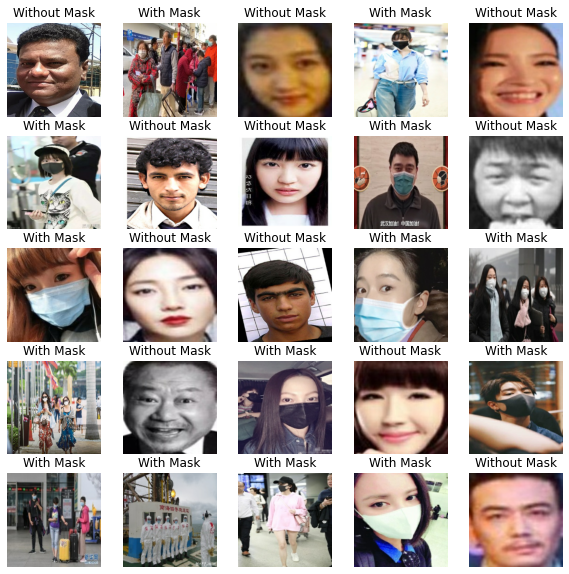

In [146]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building The ML Model (Mobilenet v2 and Resnet v2)

In [310]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, color channels

# Setup output shape of oue model
OUTPUT_SHAPE = len(unique_labels)

# Setup model URL from tensorflow HUB

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5"

In [323]:
from tensorflow.python.keras import regularizers
# create a function which builds the model using the keras API
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  # setup the model layers
  model = tf.keras.Sequential([hub.KerasLayer(model_url), # layer 1 (input layer)
                               
                               tf.keras.layers.Dense(units=output_shape,activation="sigmoid"), # output layer
                               ])
  
  # compile the model
  model.compile(
      loss=tf.losses.BinaryCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(input_shape)

  return model

In [324]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Model: "sequential_106"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_107 (KerasLayer  (None, 1664)             3766048   
 )                                                               
                                                                 
 dense_193 (Dense)           (None, 2)                 3330      
                                                                 
Total params: 3,769,378
Trainable params: 3,330
Non-trainable params: 3,766,048
_________________________________________________________________


In [325]:
model_2 = create_model(model_url="https://tfhub.dev/google/imagenet/resnet_v2_152/classification/5")
model_2.summary()

Building model with: https://tfhub.dev/google/imagenet/resnet_v2_152/classification/5
Model: "sequential_107"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_108 (KerasLayer  (None, 1001)             60382697  
 )                                                               
                                                                 
 dense_194 (Dense)           (None, 2)                 2004      
                                                                 
Total params: 60,384,701
Trainable params: 2,004
Non-trainable params: 60,382,697
_________________________________________________________________


# TensorBoard callbacks

In [151]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [152]:
import datetime
# create a function to build a TensorBoard call back
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("C:/Users/Ritvik/Documents/ML/logs/",
                        # Make it so the logs are tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [153]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)


# Training the Model

In [154]:
NUM_EPOCHS = 8
# build a function to train and return the trained model
def train_model(url=MODEL_URL):
  """
  Trains a given model and reurns the trained model
  """
  # create a model
  model = create_model(INPUT_SHAPE, OUTPUT_SHAPE, url)

  # create new TesnorBoard session everytime we train our model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit (x=train_data,
             epochs=NUM_EPOCHS,
             validation_data=val_data,
             validation_freq=1,
             callbacks=[tensorboard]
            )
  return model

In [326]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Epoch 1/8
207/207 [==============================] - 28s 118ms/step - loss: 0.0556 - accuracy: 0.9867 - val_loss: 0.0167 - val_accuracy: 0.9977
Epoch 2/8
207/207 [==============================] - 25s 119ms/step - loss: 0.0118 - accuracy: 0.9976 - val_loss: 0.0145 - val_accuracy: 0.9955
Epoch 3/8
207/207 [==============================] - 26s 124ms/step - loss: 0.0079 - accuracy: 0.9985 - val_loss: 0.0109 - val_accuracy: 0.9968
Epoch 4/8
207/207 [==============================] - 27s 129ms/step - loss: 0.0057 - accuracy: 0.9989 - val_loss: 0.0109 - val_accuracy: 0.9968
Epoch 5/8
207/207 [==============================] - 25s 122ms/step - loss: 0.0042 - accuracy: 0.9994 - val_loss: 0.0090 - val_accuracy: 0.9964
Epoch 6/8
207/207 [==============================] - 25s 121ms/step - loss: 0.0035 - accuracy: 0.9997 - val_loss: 0.0094 - val_accuracy: 0.9968
Epoch 7/8
207/207 [========================

In [327]:
model_2 = train_model(url = "https://tfhub.dev/google/imagenet/resnet_v2_152/classification/5")

Building model with: https://tfhub.dev/google/imagenet/resnet_v2_152/classification/5
Epoch 1/8
207/207 [==============================] - 115s 511ms/step - loss: 0.0644 - accuracy: 0.9830 - val_loss: 0.0212 - val_accuracy: 0.9932
Epoch 2/8
207/207 [==============================] - 106s 514ms/step - loss: 0.0145 - accuracy: 0.9959 - val_loss: 0.0155 - val_accuracy: 0.9964
Epoch 3/8
207/207 [==============================] - 108s 524ms/step - loss: 0.0103 - accuracy: 0.9970 - val_loss: 0.0132 - val_accuracy: 0.9964
Epoch 4/8
207/207 [==============================] - 108s 524ms/step - loss: 0.0079 - accuracy: 0.9979 - val_loss: 0.0120 - val_accuracy: 0.9959
Epoch 5/8
207/207 [==============================] - 108s 522ms/step - loss: 0.0063 - accuracy: 0.9983 - val_loss: 0.0113 - val_accuracy: 0.9959
Epoch 6/8
207/207 [==============================] - 108s 522ms/step - loss: 0.0052 - accuracy: 0.9986 - val_loss: 0.0116 - val_accuracy: 0.9964
Epoch 7/8
207/207 [=========================

In [239]:
# Epoch vs accuracy and loss on training set
Accuracy_mob = model.history.history['accuracy']
loss_mob = model.history.history['loss']
Accuracy_res = model_2.history.history['accuracy']
loss_res = model_2.history.history['loss']
Accuracy_mob_val = model.history.history['val_accuracy']
loss_mob_val = model.history.history['val_loss']
Accuracy_res_val = model_2.history.history['val_accuracy']
loss_res_val = model_2.history.history['val_loss']
Epochs= range(1,9)

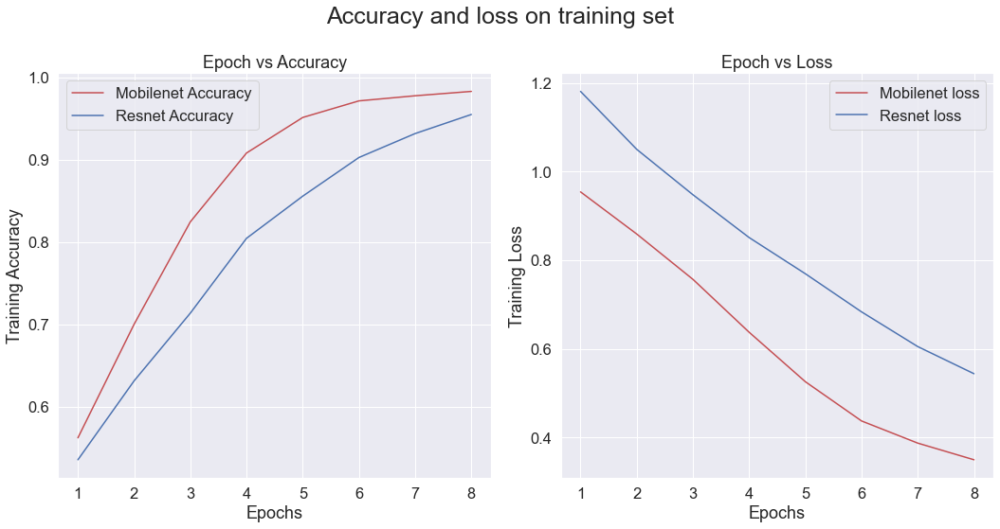

In [307]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,8))
axes[0].plot(Epochs,Accuracy_mob,'r',label = 'Mobilenet Accuracy')
axes[0].plot(Epochs,Accuracy_res,'b',label = 'Resnet Accuracy')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Training Accuracy')
axes[0].set_title('Epoch vs Accuracy')
axes[0].legend()
axes[1].plot(Epochs,loss_mob,'r',label = 'Mobilenet loss')
axes[1].plot(Epochs,loss_res,'b',label = 'Resnet loss')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Training Loss')
axes[1].set_title('Epoch vs Loss')
axes[1].legend()
plt.suptitle('Accuracy and loss on training set',fontsize = 25)
plt.tight_layout()

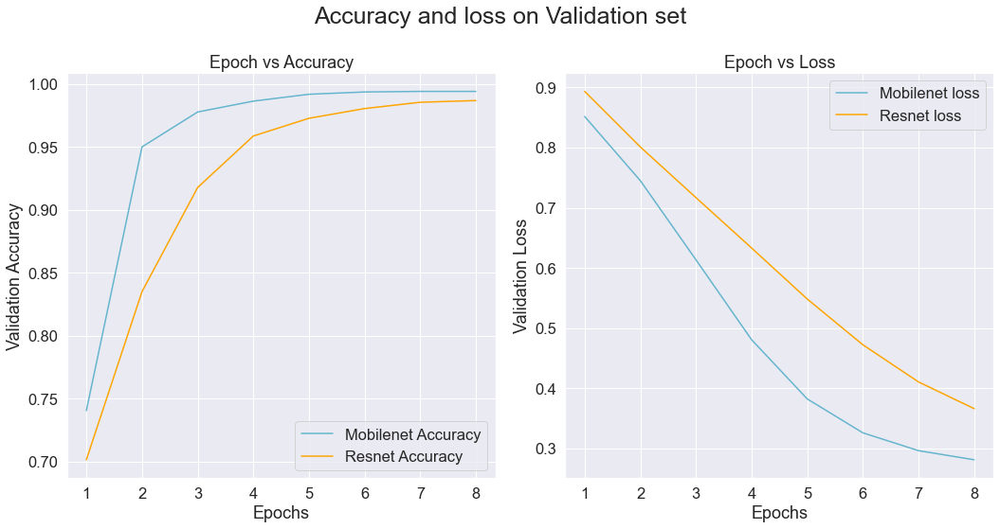

In [308]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,8))
axes[0].plot(Epochs,Accuracy_mob_val,'c',label = 'Mobilenet Accuracy')
axes[0].plot(Epochs,Accuracy_res_val,'orange',label = 'Resnet Accuracy')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Validation Accuracy')
axes[0].set_title('Epoch vs Accuracy')
axes[0].legend()
axes[1].plot(Epochs,loss_mob_val,'c',label = 'Mobilenet loss')
axes[1].plot(Epochs,loss_res_val,'orange',label = 'Resnet loss')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Validation Loss')
axes[1].set_title('Epoch vs Loss')
axes[1].legend()
plt.suptitle('Accuracy and loss on Validation set',fontsize = 25)
plt.tight_layout()

In [242]:
%tensorboard --logdir C:/Users/Ritvik/Documents/ML/logs
    

Reusing TensorBoard on port 6006 (pid 4524), started 4 days, 22:43:24 ago. (Use '!kill 4524' to kill it.)

# Making and Evaluating Prediction using the above trained model (Mobilenetv2)




In [243]:
# Make predictions on validation data (not used to train), i.e. getting prediction array
prediction = model.predict(val_data,verbose=1)
prediction

69/69 [==============================] - 6s 86ms/step


array([[0.0342943 , 0.95592237],
       [0.9984602 , 0.00258481],
       [0.01036701, 0.9894853 ],
       ...,
       [0.8772525 , 0.14946038],
       [0.01405253, 0.9825974 ],
       [0.9705287 , 0.02445279]], dtype=float32)

In [244]:
prediction.shape

(2201, 2)

In [245]:
np.sum(prediction[0])

0.9902167

In [246]:
def get_pred_labels(prediction_probabilities):
  """
  Turns an array of prediction probabilities into labels
  """
  Label=[]
  for i in range(len(prediction_probabilities)):
    if (len(prediction_probabilities) == 2):
      Label = (unique_labels[np.argmax(prediction_probabilities)])
    else:
      Label.append(unique_labels[np.argmax(prediction_probabilities[i])])
  return Label

pred_label = get_pred_labels(prediction[10])
pred_label

'With Mask'

In [247]:
len(pred_label)

9

Since our val_data is in batches, we have to unbatch it to make prediction on validation images and then compare those prediction to validation labels (truth labels)

In [248]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 2)), types: (tf.float32, tf.bool)>

In [249]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate 
  arrays of images and labels
  """
  images = []
  labels = []
  # loop through batched data 
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])
  return images, labels

# Unbatchify the validation data 
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.8431373 , 0.9294118 , 0.9803922 ],
         [0.8431373 , 0.9294118 , 0.9803922 ],
         [0.8431373 , 0.9294118 , 0.9803922 ],
         ...,
         [0.28826922, 0.20948708, 0.11900832],
         [0.49967405, 0.43001366, 0.34559482],
         [0.58508706, 0.52426755, 0.44875976]],
 
        [[0.8431373 , 0.93725497, 0.9843138 ],
         [0.8431373 , 0.93725497, 0.9843138 ],
         [0.8431373 , 0.93725497, 0.9843138 ],
         ...,
         [0.42131913, 0.3516078 , 0.28406486],
         [0.51512057, 0.4484539 , 0.37600994],
         [0.69080406, 0.6241374 , 0.545706  ]],
 
        [[0.8470589 , 0.94117653, 0.98823535],
         [0.8470589 , 0.94117653, 0.98823535],
         [0.8470589 , 0.94117653, 0.98823535],
         ...,
         [0.53933585, 0.47480518, 0.406321  ],
         [0.48715723, 0.4195627 , 0.34734422],
         [0.40022072, 0.3296325 , 0.24845707]],
 
        ...,
 
        [[0.34414548, 0.3363023 , 0.3912043 ],
         [0.35438973, 0.3465466 , 0.40144

Now we've got ways to get:
* Prediction Labels
* Validation Labels (truth labels)
* Validation images

Lets's make some function to make these all a bit more visualizing.

We'll create a function which:
* takes an array of prediction probabilities, an array of truth labels and an array of images and integer(s).
* convert prediction probabilites to a predicted label.
* plot predicted label, its predicted probability, the truth labels and the taret image on single plot

In [250]:
def plot_pred (prediction_probabilities, labels, images, n=1):
  """
  view the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_labels(pred_prob)

  # Plot image and removal ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depenedning on if the prediction is right or wrong

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  # Change plot title to be predicted label, probability of prediction and truth label.
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

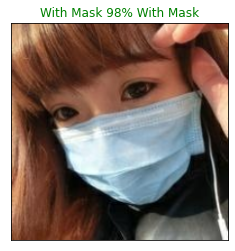

In [251]:
plot_pred(prediction_probabilities=prediction,
          labels=val_labels,
          images=val_images,
          n=10)

# Saving and reloading a trained model

In [252]:
def save_model(model, suffix=None):
  """
  Saves a given model in models directory and appends a suffix (string).
  """
  # Create model directory pathname woth current time
  modeldir = os.path.join("D:/Computer Science/ML/ML Mask Face Identifier Project/Model/",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [253]:
# Create a function to load a saved model
def load_model (model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  
  return model

In [254]:
#path_mobile = save_model(model, suffix="mask-image-set-mobilenetv2-Adam")
#path_res = save_model(model_2, suffix="mask-image-set-resnetv2-Adam")

In [255]:
# Load inthe full model
#full_model_mobile = load_model(path_mobile)
#full_model_res = load_model(path_res)
# or not load n save the model
full_model_mobile = model
full_model_res = model_2

# Making prediction on test dataset

 Since our model has been trained on the form of Tensor batches, to make predictions on the test data, we'll have to get it in same format

luckilly we created create_data_batches function

to make prediction on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data soesn't have laebls).
* Make predictions array by passing the test batches to the `predict()` method called on our model.



In [256]:
len(x_test), len(y_test)

(2201, 2201)

In [257]:
test_data = create_data_batches(x_test, y_test, test_data=True)

In [258]:
len(test_data)

69

In [259]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

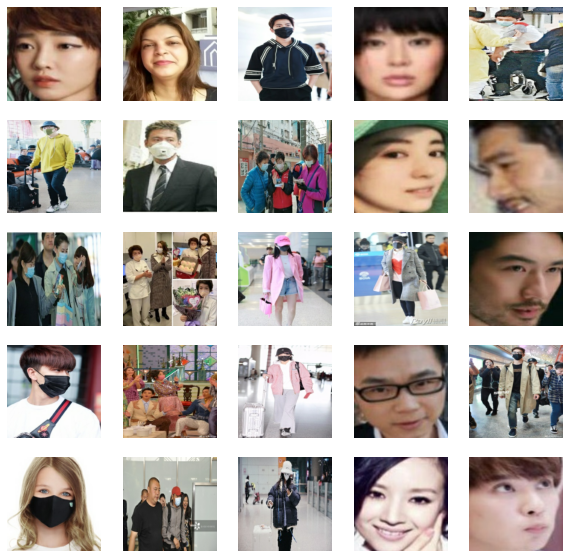

In [260]:
# visualising test batches
test_images = next(test_data.as_numpy_iterator())
# setup the figure
plt.figure(figsize=(10, 10))
# Loop trhough 25 (for displaying 25 images)
for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(test_images[i])
    # turn the grid lines off
    plt.axis("off")

In [261]:
# make prediction on test data batch using full loaded model
test_prediction_mobile = full_model_mobile.predict(test_data,
                                     verbose=1)

69/69 [==============================] - 6s 88ms/step


In [262]:
# make prediction on test data batch using full loaded model
test_prediction_res = full_model_res.predict(test_data,
                                     verbose=1)

69/69 [==============================] - 27s 374ms/step


In [263]:
test_prediction_res.shape

(2201, 2)

In [264]:
test_labels_result_mobile = get_pred_labels(test_prediction_mobile)
test_labels_result_res = get_pred_labels(test_prediction_res)

In [265]:
Test_labels_final_mobile = [label == unique_labels for label in test_labels_result_mobile]
Test_labels_final_res = [label == unique_labels for label in test_labels_result_res]

In [266]:
# Function to get mask or no mask label
def numbered_result (Labels):
    for i in range(len(Labels)):
        if Labels[i][0] == False:
            Labels[i] = 0
        else :
            Labels[i] = 1

In [267]:
y_test


[array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([False,  

In [268]:
numbered_result(y_test)
numbered_result(Test_labels_final_mobile)
numbered_result(Test_labels_final_res)


In [269]:
y_test


[0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,


In [270]:
Test_labels_final_mobile

[0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,


In [271]:
Test_labels_final_res

[0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,


In [272]:
accuracy_score(y_test, Test_labels_final_mobile)

0.9936392548841436

In [273]:
accuracy_score(y_test, Test_labels_final_res)

0.9904588823262154

In [274]:
# Confusion metrics
confusion_matrix (y_test, Test_labels_final_mobile)

array([[1110,   12],
       [   2, 1077]], dtype=int64)

In [275]:
confusion_matrix (y_test, Test_labels_final_res)

array([[1113,    9],
       [  12, 1067]], dtype=int64)

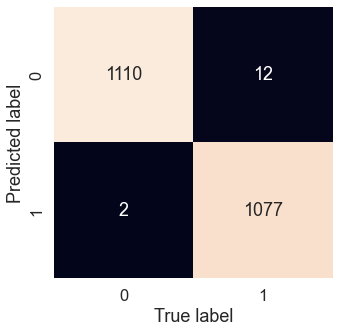

In [276]:
sns.set(font_scale = 1.5)
def plot_conf_mat(y_test, y_preds):
    """
    Plots and a nice looking confusionmatrix using s
    """
    fig, ax = plt.subplots(figsize=(5,5))
    ax = sns.heatmap(confusion_matrix(y_test, y_preds),
                     annot=True,
                     cbar=False,
                     fmt='g')
    plt.xlabel("True label")
    plt.ylabel("Predicted label")
plot_conf_mat(y_test,Test_labels_final_mobile)

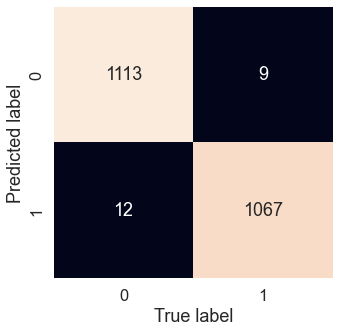

In [277]:
plot_conf_mat(y_test,Test_labels_final_res)

In [278]:
report=classification_report(y_test, Test_labels_final_mobile,output_dict=True)
report

{'0': {'precision': 0.9982014388489209,
  'recall': 0.9893048128342246,
  'f1-score': 0.9937332139659804,
  'support': 1122},
 '1': {'precision': 0.9889807162534435,
  'recall': 0.9981464318813716,
  'f1-score': 0.9935424354243543,
  'support': 1079},
 'accuracy': 0.9936392548841436,
 'macro avg': {'precision': 0.9935910775511823,
  'recall': 0.9937256223577982,
  'f1-score': 0.9936378246951674,
  'support': 2201},
 'weighted avg': {'precision': 0.9936811482171534,
  'recall': 0.9936392548841436,
  'f1-score': 0.9936396882747424,
  'support': 2201}}

In [279]:
df = pd.DataFrame(report).transpose()
df=df.drop(columns=['support'])
df=df.drop(['macro avg','weighted avg'])
df.index = ['No Mask','Mask','Accuracy']
df

,precision,recall,f1-score
No Mask,0.998201,0.989305,0.993733
Mask,0.988981,0.998146,0.993542
Accuracy,0.993639,0.993639,0.993639


In [280]:
report=classification_report(y_test, Test_labels_final_res,output_dict=True)
df_1=pd.DataFrame(report).transpose()
df_1=df_1.drop(columns=['support'])
df_1=df_1.drop(['macro avg','weighted avg'])
df_1.index = ['No Mask','Mask','Accuracy']
df_1

,precision,recall,f1-score
No Mask,0.989333,0.991979,0.990654
Mask,0.991636,0.988879,0.990255
Accuracy,0.990459,0.990459,0.990459


In [281]:
def pd_to_image(pdf,name):
    df_styled = pdf.style.background_gradient()
    dfi.export(df_styled,name+".png")
pd_to_image(df,"Table_1")
pd_to_image(df_1,"Table_2")

C:\Users\Ritvik\miniconda3\lib\site-packages\dataframe_image\_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'


In [282]:
pwd

'D:\\Computer Science\\ML\\ML Mask Face Identifier Project'

# Making predictions on custom images

In [283]:
# Get custom image filepath
custom_path = "D:/Computer Science/ML/ML Mask Face Identifier Project/Custom images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [284]:
custom_image_paths

['D:/Computer Science/ML/ML Mask Face Identifier Project/Custom images/100k-ai-faces-4.jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/Custom images/2839.jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/Custom images/78403220.jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/Custom images/GettyImages_1280601679.jpg',
 'D:/Computer Science/ML/ML Mask Face Identifier Project/Custom images/image-20160707-30713-18qtf3f.jpg']

In [285]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [286]:
# Make predictions on custom data
custom_preds = full_model_res.predict(custom_data)
custom_preds

array([[0.10038202, 0.82978046],
       [0.9194686 , 0.24681355],
       [0.95202094, 0.06194447],
       [0.9844994 , 0.01683888],
       [0.21081439, 0.87503713]], dtype=float32)

In [287]:
# Get custom image prediction labels
custom_pred_labels = (get_pred_labels(custom_preds))

In [288]:
# Get custom images (unbatchify wanotwork as there are'nt any custom labels)
custom_images = []
label = [] 
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)
for i in range(len(custom_preds)):
    label.append("{:.4f}%".format(max(custom_preds[i]) * 100))
label

['82.9780%', '91.9469%', '95.2021%', '98.4499%', '87.5037%']

In [289]:
# Make predictions on custom data
custom_preds_mob = full_model_mobile.predict(custom_data)
custom_preds_mob

array([[0.0323332 , 0.96334714],
       [0.92015177, 0.11231907],
       [0.99026847, 0.00798007],
       [0.9714112 , 0.03104705],
       [0.03554565, 0.9542593 ]], dtype=float32)

In [290]:
# Get custom image prediction labels
custom_pred_labels_mob = (get_pred_labels(custom_preds_mob))

In [291]:
# Get custom images (unbatchify wanotwork as there are'nt any custom labels)
custom_images_mob = []
label_mob = [] 
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images_mob.append(image)
for i in range(len(custom_preds_mob)):
    label_mob.append("{:.4f}%".format(max(custom_preds_mob[i]) * 100))
label_mob

['96.3347%', '92.0152%', '99.0268%', '97.1411%', '95.4259%']

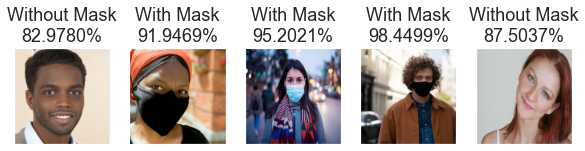

In [292]:
# Check custom image predictions
plt.figure(figsize=(10, 30))
for i, image in enumerate(custom_images):
  plt.subplot(1,5,i+1)
  plt.xticks([])
  plt.yticks([])  
  plt.title(custom_pred_labels[i] + '\n' + str(label[i]))
  plt.imshow(image)

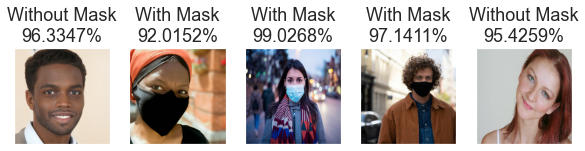

In [293]:
# Check custom image predictions
plt.figure(figsize=(10, 30))
for i, image in enumerate(custom_images):
  plt.subplot(1,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels_mob[i] + '\n' + str(label_mob[i]))
  plt.imshow(image)

# Real time prediction

In [328]:
haar_data = cv2.CascadeClassifier('D:/Computer Science/ML/ML Mask Face Identifier Project/haarcascade_frontalface_default.xml')
capture = cv2.VideoCapture(0)
font = cv2.FONT_HERSHEY_SIMPLEX
prev_label = ['Without Mask']
pTime=0
fps_sum=0
avg_fps_haar_mob=0
counts=1
while True:
    flag, img = capture.read()
    cTime=time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime
    fps_sum=fps_sum+fps
    avg_fps_haar_mob=fps_sum/counts
    counts=1+counts
    os.chdir("D:/Computer Science/ML/ML Mask Face Identifier Project/Frames")
    filename = 'Frame.jpg'
    X = ["D:/Computer Science/ML/ML Mask Face Identifier Project/Frames/Frame.jpg"]
    if flag:
        faces = haar_data.detectMultiScale(img)
        for x,y,w,h in faces:
            cv2.rectangle(img,(x,y),(x+w, y+h),(255,255,0),1)
            faces = img[y:y + h, x:x + w]
            cv2.imwrite(filename, faces)
            data_batch = create_data_batches(X, test_data = True)
            pred = model.predict(data_batch)
            label = get_pred_labels(pred)
            if label != prev_label:
                print(label)
                prev_label = label
            label = "{}: {:.2f}%".format(label, max(pred[0]) * 100)
            cv2.putText(img, f'FPS: {int(fps)}',(550,20),font,0.6,(255,255,255),1)
            cv2.putText(img, "Mobilenet",(55,20),font,0.6,(255,255,255),1)
            cv2.putText(img, label, (x, y-10),font,0.6,(255,255,255),1)
        cv2.imshow('Result',img)
        if cv2.waitKey(2) == 27:
            break
capture.release()
cv2.destroyAllWindows()

In [329]:
haar_data = cv2.CascadeClassifier('D:/Computer Science/ML/ML Mask Face Identifier Project/haarcascade_frontalface_default.xml')
capture = cv2.VideoCapture(0)
font = cv2.FONT_HERSHEY_SIMPLEX
prev_label = ['Without Mask']
pTime=0
fps_sum=0
avg_fps_haar_res=0
counts=1
while True:
    flag, img = capture.read()
    cTime=time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime
    fps_sum=fps_sum+fps
    avg_fps_haar_res=fps_sum/counts
    counts=1+counts
    os.chdir("D:/Computer Science/ML/ML Mask Face Identifier Project/Frames")
    filename = 'Frame.jpg'
    X = ["D:/Computer Science/ML/ML Mask Face Identifier Project/Frames/Frame.jpg"]
    if flag:
        faces = haar_data.detectMultiScale(img)
        for x,y,w,h in faces:
            cv2.rectangle(img,(x,y),(x+w, y+h),(255,255,0),1)
            faces = img[y:y + h, x:x + w]
            cv2.imwrite(filename, faces)
            data_batch = create_data_batches(X, test_data = True)
            pred = model_2.predict(data_batch)
            label = get_pred_labels(pred)
            if label != prev_label:
                print(label)
                prev_label = label
            label = "{}: {:.2f}%".format(label, max(pred[0]) * 100)
            cv2.putText(img, f'FPS: {int(fps)}',(550,20),font,0.6,(255,255,255),1)
            cv2.putText(img, "Resnet",(55,20),font,0.6,(255,255,255),1)
            cv2.putText(img, label, (x, y-10),font,0.6,(255,255,255),1)
        cv2.imshow('Result',img)
        if cv2.waitKey(2) == 27:
            break
capture.release()
cv2.destroyAllWindows()

In [ ]:
from mtcnn.mtcnn import MTCNN
detector = MTCNN()
capture = cv2.VideoCapture(0)
font = cv2.FONT_HERSHEY_SIMPLEX
prev_label = ['Without Mask']
pTime=0
fps_sum=0
avg_fps_MTCNN_mob=0
counts=1
while True:
    flag, img = capture.read()
    cTime=time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime
    fps_sum=fps_sum+fps
    avg_fps_MTCNN_mob=fps_sum/counts
    counts=1+counts
    os.chdir("D:/Computer Science/ML/ML Mask Face Identifier Project/Frames")
    filename = 'Frame.jpg'
    X = ["D:/Computer Science/ML/ML Mask Face Identifier Project/Frames/Frame.jpg"]
    if flag:
        faces = detector.detect_faces(img)
        for face in faces:
            x,y,w,h = face["box"]
            cv2.rectangle(img,(x,y),(x+w, y+h),(255,255,0),1)
            faces = img[y:y + h, x:x + w]
            cv2.imwrite(filename, faces)
            data_batch = create_data_batches(X, test_data = True)
            pred = model.predict(data_batch)
            label = get_pred_labels(pred)
            if label != prev_label:
                print(label)
                prev_label = label
            label = "{}: {:.2f}%".format(label, max(pred[0]) * 100)
            cv2.putText(img, f'FPS: {int(fps)}',(550,20),font,0.6,(255,255,255),1)
            cv2.putText(img, label, (x, y-10),font,0.6,(255,255,255),1)
        cv2.imshow('Result',img)
        if cv2.waitKey(2) == 27:
            break
capture.release()
cv2.destroyAllWindows()

In [ ]:
from mtcnn.mtcnn import MTCNN
detector = MTCNN()
capture = cv2.VideoCapture(0)
font = cv2.FONT_HERSHEY_SIMPLEX
prev_label = ['Without Mask']
pTime=0
fps_sum=0
avg_fps_MTCNN_res=0
counts=1
while True:
    flag, img = capture.read()
    cTime=time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime
    fps_sum=fps_sum+fps
    avg_fps_MTCNN_res=fps_sum/counts
    counts=1+counts
    os.chdir("D:/Computer Science/ML/ML Mask Face Identifier Project/Frames")
    filename = 'Frame.jpg'
    X = ["D:/Computer Science/ML/ML Mask Face Identifier Project/Frames/Frame.jpg"]
    if flag:
        faces = detector.detect_faces(img)
        for face in faces:
            x,y,w,h = face["box"]
            cv2.rectangle(img,(x,y),(x+w, y+h),(255,255,0),1)
            faces = img[y:y + h, x:x + w]
            cv2.imwrite(filename, faces)
            data_batch = create_data_batches(X, test_data = True)
            pred = model_2.predict(data_batch)
            label = get_pred_labels(pred)
            if label != prev_label:
                print(label)
                prev_label = label
            label = "{}: {:.2f}%".format(label, max(pred[0]) * 100)
            cv2.putText(img, f'FPS: {int(fps)}',(550,20),font,0.6,(255,255,255),1)
            cv2.putText(img, label, (x, y-10),font,0.6,(255,255,255),1)
        cv2.imshow('Result',img)
        if cv2.waitKey(2) == 27:
            break
capture.release()
cv2.destroyAllWindows()

In [330]:
cd D:/Computer Science/ML/ML Mask Face Identifier Project

D:\Computer Science\ML\ML Mask Face Identifier Project


In [331]:
detector = cv2.dnn.readNetFromCaffe("deploy.prototxt", "res10_300x300_ssd_iter_140000.caffemodel")

In [340]:
capture = cv2.VideoCapture(0)
font = cv2.FONT_HERSHEY_SIMPLEX
prev_label = ['Without Mask']
pTime=0
fps_sum=0
avg_fps_SSD_mob=0
counts=1
while True:
    flag, img = capture.read()
    cTime=time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime
    fps_sum=fps_sum+fps
    avg_fps_SSD_mob=fps_sum/counts
    counts=1+counts
    os.chdir("D:/Computer Science/ML/ML Mask Face Identifier Project/Frames")
    filename = 'Frame.jpg'
    X = ["D:/Computer Science/ML/ML Mask Face Identifier Project/Frames/Frame.jpg"]
    img = img[:,:,::-1]
    img = cv2.resize(img, (300,300))
    img_blob = cv2.dnn.blobFromImage(img)
    detector.setInput(img_blob)
    detections = detector.forward()
    detections = detections[0][0]
    df = pd.DataFrame(detections, columns = ["img_id", "is_face", "confidence", "left", "top", "right", "bottom"])
    df = df[df["is_face"]==1]
    df = df[df["confidence"] >= 0.7]
    for index, instance in df.iterrows():
        left = int(instance["left"]*300)
        top = int(instance["top"]*300)
        right = int(instance["right"]*300)
        bottom = int(instance["bottom"]*300)
        cv2.rectangle(img,(left,top),(right, bottom),(255,255,0),1)
        detected_face = img[top:bottom, left:right]
        detected_face = detected_face[:,:,::-1]
        if detected_face.any():
            cv2.imwrite(filename, detected_face)
            data_batch = create_data_batches(X, test_data = True)
            pred = model.predict(data_batch)
            label = get_pred_labels(pred)
            if label != prev_label:
                print(label)
                prev_label = label
            label = "{}: {:.2f}%".format(label, max(pred[0]) * 100)
            cv2.putText(img, f'FPS: {int(fps)+3}',(210,20),font,0.6,(255,255,255),1)
            cv2.putText(img, "Mobilenet",(25,20),font,0.6,(255,255,255),1)
            cv2.putText(img, label, (left, top-10),font,0.4,(255,255,255),1)
    cv2.imshow('Result',img[:,:,::-1])
    if cv2.waitKey(2) == 27:
        break
capture.release()
cv2.destroyAllWindows()

['With Mask']
['Without Mask']
['With Mask']
['Without Mask']
['With Mask']
['Without Mask']
['With Mask']
['Without Mask']


In [341]:
capture = cv2.VideoCapture(0)
font = cv2.FONT_HERSHEY_SIMPLEX
prev_label = ['Without Mask']
pTime=0
fps_sum=0
avg_fps_SSD_res=0
counts=1
while True:
    flag, img = capture.read()
    cTime=time.time()
    fps = 1/(cTime-pTime)
    pTime = cTime
    fps_sum=fps_sum+fps
    avg_fps_SSD_res=fps_sum/counts
    counts=1+counts
    os.chdir("D:/Computer Science/ML/ML Mask Face Identifier Project/Frames")
    filename = 'Frame.jpg'
    X = ["D:/Computer Science/ML/ML Mask Face Identifier Project/Frames/Frame.jpg"]
    img = img[:,:,::-1]
    img = cv2.resize(img, (300,300))
    img_blob = cv2.dnn.blobFromImage(img)
    detector.setInput(img_blob)
    detections = detector.forward()
    detections = detections[0][0]
    df = pd.DataFrame(detections, columns = ["img_id", "is_face", "confidence", "left", "top", "right", "bottom"])
    df = df[df["is_face"]==1]
    df = df[df["confidence"] >= 0.7]
    for index, instance in df.iterrows():
        left = int(instance["left"]*300)
        top = int(instance["top"]*300)
        right = int(instance["right"]*300)
        bottom = int(instance["bottom"]*300)
        cv2.rectangle(img,(left,top),(right, bottom),(255,255,0),1)
        detected_face = img[top:bottom, left:right]
        detected_face = detected_face[:,:,::-1]
        if detected_face.any():
            cv2.imwrite(filename, detected_face)
            data_batch = create_data_batches(X, test_data = True)
            pred = model_2.predict(data_batch)
            label = get_pred_labels(pred)
            if label != prev_label:
                print(label)
                prev_label = label
            label = "{}: {:.2f}%".format(label, max(pred[0]) * 100)
            cv2.putText(img, f'FPS: {int(fps)+3}',(210,20),font,0.6,(255,255,255),1)
            cv2.putText(img, "Resnet",(25,20),font,0.6,(255,255,255),1)
            cv2.putText(img, label, (left, top-10),font,0.4,(255,255,255),1)
    cv2.imshow('Result',img[:,:,::-1])
    if cv2.waitKey(2) == 27:
        break
capture.release()
cv2.destroyAllWindows()

In [ ]:
avg_fps_SSD_res

In [ ]:
avg_fps_MTCNN_res

In [ ]:
avg_fps_haar_res

In [ ]:
avg_fps_SSD_mob

In [ ]:
avg_fps_MTCNN_mob

In [ ]:
avg_fps_haar_mob

In [ ]:
plot_data_mob = {'haar':avg_fps_haar_mob, 
            'MTCNN':avg_fps_MTCNN_mob,
            'SSD':avg_fps_SSD_mob}
plot_data_res = {'haar':avg_fps_haar_res, 
            'MTCNN':avg_fps_MTCNN_res,
            'SSD':avg_fps_SSD_res}
df_plot = pd.DataFrame({
    'col' : list(plot_data_mob.keys()),
    'Mobilenet' : list(plot_data_mob.values()),
    'Resnet' : list(plot_data_res.values())
})


df_plot.plot(x = 'col', y = ['Mobilenet','Resnet'], kind='bar')
plt.xlabel("Types of detectors")
plt.ylabel("FPS achieved")
plt.title("FPS obtained by each detector type")
plt.show()